[![Open notebook in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/afondiel/afondiel.github.io/blob/main/assets/images/blog-posts/edge-ai/101/lab/Deploy_RT_Segmentation_Model_On_Real_Device.ipynb)

# **Deploying Real-Time Segmentation Models On the Edge with [Qualcomm AI Hub](https://aihub.qualcomm.com/)**


<p style="background-color:#fff6e4; padding:15px; border-width:3px; border-color:#f5ecda; border-style:solid; border-radius:6px"> ⏳ <b>Note <code>(Kernel Starting)</code>:</b> This notebook takes about 30 seconds to be ready to use. You may start and watch the video while you wait.</p>

## Install Dependency Packages

In [11]:
# Install PyTorch Ecosystem Pkgs
!pip install torch torchvision torchinfo

In [ ]:
# Set up your Qualcomm AI Hub development environment:
# !pip install -q qai-hub
!pip install qai-hub
!pip install qai_hub_models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.3/96.3 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 52.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.3 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 2.3 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of torchvision to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of multiprocess to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.3/798.3 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 402.8/402.8 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.1/797.1 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.4 

## Import Necessary Libraries

In [17]:
import os
import qai_hub as hub
from qai_hub_models.models.ffnet_40s import Model
from torchinfo import summary

In [18]:
print(hub.__version__)

0.21.0


## Setup AI Hub for device-in-the-loop deployment

<p style="background-color:#fff6ff; padding:15px; border-width:3px; border-color:#efe6ef; border-style:solid; border-radius:6px"> 💻 &nbsp; <b>Access Utils File and Helper Functions:</b> To access the files for this notebook, 1) click on the <em>"File"</em> option on the top menu of the notebook and then 2) click on <em>"Open"</em>. For more help, please see the <em>"Appendix - Tips and Help"</em> Lesson.</p>

In [20]:
# Access API Token from Google Colab secret keys
ai_hub_api_token = userdata.get('QAI_HUB_API_KEY')
print(f"API Key: {ai_hub_api_token}")

API Key: 4c31c100fbae655361730c69dd588bab9d912288


In [21]:
# Access API using utils module
# from utils import get_ai_hub_api_token
# ai_hub_api_token = get_ai_hub_api_token()

# !qai-hub configure --api_token $ai_hub_api_token

In [22]:
# Configure the API KEY
!qai-hub configure --api_token $ai_hub_api_token

/usr/local/lib/python3.10/dist-packages/qai_hub/_cli.py:358: UserWarning: Overwriting configuration: /root/.qai_hub/client.ini (previous configuration saved to /root/.qai_hub/client.ini.bak)
  warnings.warn(
qai-hub configuration saved to /root/.qai_hub/client.ini
==================== /root/.qai_hub/client.ini ====================
[api]
api_token = 4c31c100fbae655361730c69dd588bab9d912288
api_url = https://app.aihub.qualcomm.com
web_url = https://app.aihub.qualcomm.com
verbose = True




In [23]:
# Check if API KEY is valid
!qai-hub list-devices

+-------------------------------+------------+----------+---------+---------------------------------------------+---------------------------------------------------------+
|             Device            |     OS     |  Vendor  |   Type  |                   Chipset                   |                      CLI Invocation                     |
+-------------------------------+------------+----------+---------+---------------------------------------------+---------------------------------------------------------+
|    Google Pixel 3 (Family)    | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-845, sdm845       |    --device "Google Pixel 3 (Family)" --device-os 10    |
|         Google Pixel 3        | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-845, sdm845       |         --device "Google Pixel 3" --device-os 10        |
|        Google Pixel 3a        | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-670, sdm670       |        --device "Google Pi

In [24]:
# Using python commands
hub.get_devices()

[Device(name='Google Pixel 3 (Family)', os='10', attributes=['os:android', 'framework:tflite', 'framework:onnx', 'abi:aarch64-android', 'vendor:google', 'format:phone', 'chipset:qualcomm-snapdragon-845', 'chipset:sdm845', 'hexagon:v65', 'soc-model:1']),
 Device(name='Google Pixel 3', os='10', attributes=['os:android', 'framework:tflite', 'framework:onnx', 'abi:aarch64-android', 'vendor:google', 'format:phone', 'chipset:qualcomm-snapdragon-845', 'chipset:sdm845', 'hexagon:v65', 'soc-model:1']),
 Device(name='Google Pixel 3a', os='10', attributes=['os:android', 'framework:tflite', 'framework:onnx', 'abi:aarch64-android', 'vendor:google', 'format:phone', 'chipset:qualcomm-snapdragon-670', 'chipset:sdm670', 'hexagon:v65', 'soc-model:6']),
 Device(name='Google Pixel 3 XL', os='10', attributes=['os:android', 'framework:tflite', 'framework:onnx', 'abi:aarch64-android', 'vendor:google', 'format:phone', 'chipset:qualcomm-snapdragon-845', 'chipset:sdm845', 'hexagon:v65', 'soc-model:1']),
 Device

## Load Pre-trained [FFNet40S](https://aihub.qualcomm.com/mobile/models/ffnet_40s) Model from [Qualcomm AI Hub Models](https://aihub.qualcomm.com/models) and Display Summary

In [25]:
# Load from pre-trained weights
model = Model.from_pretrained()
input_shape = (1, 3, 1024, 2048)
# Display Summary
stats = summary(
    model,
    input_size=input_shape,
    col_names=["num_params", "mult_adds"]
)
print(stats)

Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Layer (type:depth-idx)                                       Param #                   Mult-Adds
FFNet40S                                                     --                        --
├─FFNet: 1-1                                                 --                        --
│    └─ResNetS: 2-1                                          --                        --
│    │    └─Conv2d: 3-1                                      864                       452,984,832
│    │    └─BatchNorm2d: 3-2                                 64                        64
│    │    └─ReLU: 3-3                                        --                        --
│    │    └─Conv2d: 3-4                                      18,432                    2,415,919,104
│    │    └─BatchNorm2d: 3-5                                 128                    

## Exercise: Try another variant of FFNet

In [26]:
# High resolution variants
# from qai_hub_models.models.ffnet_40s import Model
#from qai_hub_models.models.ffnet_54s import Model
#from qai_hub_models.models.ffnet_78s import Model
# input_shape = (1, 3, 1024, 2048)

# Low resolution variants
low_res_input_shape = (1, 3, 512, 1024)
from qai_hub_models.models.ffnet_78s_lowres import Model
#from qai_hub_models.models.ffnet_122ns_lowres import Model

model = Model.from_pretrained()
stats = summary(
    model,
#   input_size=input_shape, # use input_shape for high_res models
  input_size=low_res_input_shape, # use low_res_input_shape for low_res models
  col_names=["num_params", "mult_adds"]
)
print(stats)

Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet78S/ffnet78S_BCC_cityscapes_state_dict_quarts.pth
Initializing ffnnet78S_BCC_mobile_pre_down weights
Layer (type:depth-idx)                                       Param #                   Mult-Adds
FFNet78SLowRes                                               --                        --
├─FFNet: 1-1                                                 --                        --
│    └─GaussianConv2D: 2-1                                   --                        --
│    └─ResNetS: 2-2                                          --                        --
│    │    └─Conv2d: 3-1                                      864                       28,200,960
│    │    └─BatchNorm2d: 3-2                                 64                        64
│    │    └─ReLU: 3-3                                        --                        --
│    │    └─Conv2d: 3-4                                      18,432                    15

## Run the demo on the cloud


100%|██████████| 443k/443k [00:00<00:00, 1.52MB/s]


Done
Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights


/root/.qaihm/models/cityscapes_segmentation/v2/Qualcomm-AI-research_FFNet_git/models/ffnet_blocks.py:599: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_dict = tor

Running Inference on 0 samples


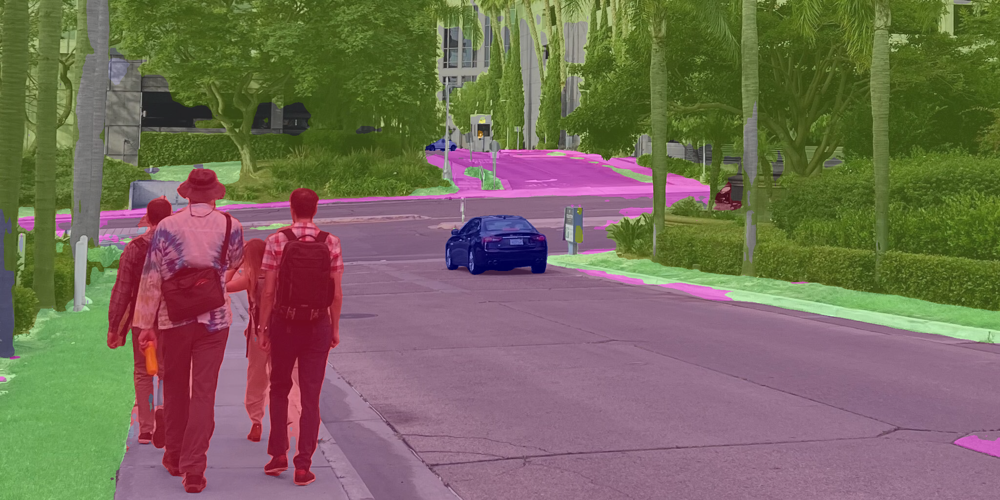

In [27]:
# Run inference on a single image sample on hosted model on the qai hub server
# Goal: Achieve the same results (performance) on a particluar the device
%run -m qai_hub_models.models.ffnet_40s.demo

In [32]:
!pip install -q memory_profiler

Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Running Inference on 0 samples


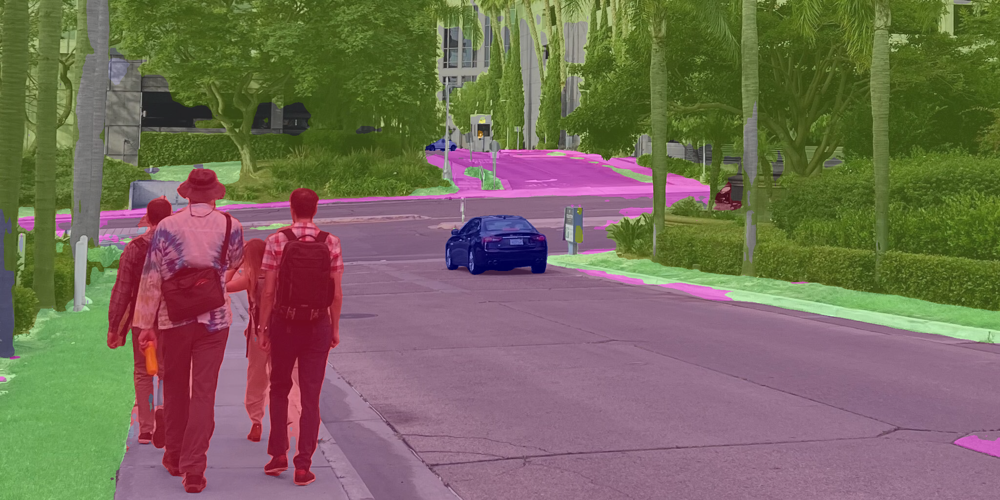

Inference time: 0.005 seconds
Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Running Inference on 0 samples


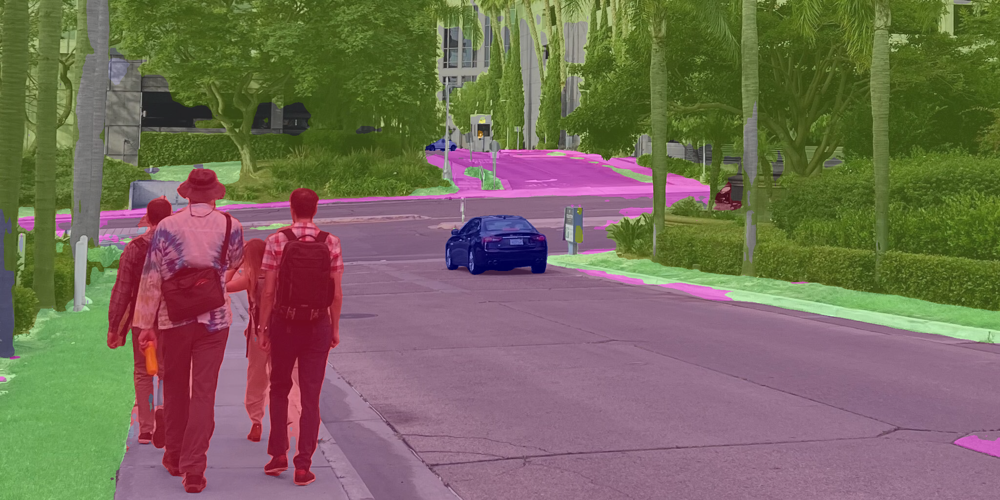

Peak Memory Usage: 1765.25 MiB


In [35]:
import time
from memory_profiler import memory_usage

def run_inference():
    %run -m qai_hub_models.models.ffnet_40s.demo

# Run inference
start_time = time.time()
run_inference()
end_time = time.time()
# inference_time = end_time - start_time
print(f"Inference time: {((end_time - start_time)/1000):.3f} ms")

mem_usage = memory_usage(run_inference)
peak_memory = max(mem_usage)
print(f"Peak Memory Usage: {peak_memory} MiB")

## Run on a real smart phone!

<p style="background-color:#fff6e4; padding:15px; border-width:3px; border-color:#f5ecda; border-style:solid; border-radius:6px"> ⏳ <b>Note:</b> To spread the load across various devices, we are selecting a random device. Feel free to change it to any other device you prefer.</p>

In [28]:
# List of Devices available/hosted
!qai-hub list-devices

+-------------------------------+------------+----------+---------+---------------------------------------------+---------------------------------------------------------+
|             Device            |     OS     |  Vendor  |   Type  |                   Chipset                   |                      CLI Invocation                     |
+-------------------------------+------------+----------+---------+---------------------------------------------+---------------------------------------------------------+
|    Google Pixel 3 (Family)    | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-845, sdm845       |    --device "Google Pixel 3 (Family)" --device-os 10    |
|         Google Pixel 3        | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-845, sdm845       |         --device "Google Pixel 3" --device-os 10        |
|        Google Pixel 3a        | Android 10 |  Google  |  Phone  |       qualcomm-snapdragon-670, sdm670       |        --device "Google Pi

In [29]:
import random

devices = [
    "Samsung Galaxy S22 Ultra 5G",
    "Samsung Galaxy S22 5G",
    "Samsung Galaxy S22+ 5G",
    "Samsung Galaxy Tab S8",
    "Xiaomi 12",
    "Xiaomi 12 Pro",
    "Samsung Galaxy S22 5G",
    "Samsung Galaxy S23",
    "Samsung Galaxy S23+",
    "Samsung Galaxy S23 Ultra",
    "Samsung Galaxy S24",
    "Samsung Galaxy S24 Ultra",
    "Samsung Galaxy S24+",
]

selected_device = random.choice(devices)
print(selected_device)

Samsung Galaxy Tab S8


In [30]:
# Run inference on the hosted device in the cloud
# Goal: Achieve the same results (performance) as the cloud server
"""
Device in the Loop workflow:
 Upload the model >> Optimize >> Compile >> Profile >> Inference

Running Steps:
 - Upload the model from PyTorch
 - Converted and compiled for the Selected Device (i.e.: Xiaomi 12 Pro)
 - And provision the device in the cloud ready to be used
 - Run Profiling performance
 - Run inference on the hosted device in the cloud, using the sample image as
  before for ease benchhmark
"""
# %run -m qai_hub_models.models.ffnet_40s.export -- --device "$selected_device"
%run -m qai_hub_models.models.ffnet_40s.export -- --device "Xiaomi 12 Pro"

Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Optimizing model ffnet_40s to run on-device
Uploading tmpey8mgpmy.pt


100%|██████████| 53.6M/53.6M [00:02<00:00, 23.3MB/s]


Scheduled compile job (j5mnjlv9p) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/j5mnjlv9p/

Profiling model ffnet_40s on a hosted device.
Waiting for compile job (j5mnjlv9p) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Scheduled profile job (jgn6jwrq5) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jgn6jwrq5/

Running inference for ffnet_40s on a hosted device with example inputs.


Uploading dataset: 21.5MB [00:01, 15.7MB/s]                            


Scheduled inference job (jprvz717g) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jprvz717g/



ffnet_40s.tflite: 100%|██████████| 53.1M/53.1M [00:03<00:00, 15.9MB/s]


Downloaded model to /content/build/ffnet_40s/ffnet_40s.tflite
Waiting for profile job (jgn6jwrq5) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          

------------------------------------------------------------
Performance results on-device for Ffnet_40S.
------------------------------------------------------------
Device                          : Xiaomi 12 Pro (12)
Runtime                         : TFLITE            
Estimated inference time (ms)   : 56.9              
Estimated peak memory usage (MB): [2, 19]           
Total # Ops                     : 94                
Compute Unit(s)                 : NPU (94 ops)      
------------------------------------------------------------
More details: https://app.aihub.qualcomm.com/jobs/jgn6jwrq5/



tmpfqt_oims.h5: 100%|██████████| 1.22M/1.22M [00:00<00:00, 2.97MB/s]



Comparing on-device vs. local-cpu inference for Ffnet_40S.
+---------------+-------------------+--------+
| output_name   | shape             |   psnr |
+===============+===================+========+
| mask          | (1, 128, 256, 19) |   72.7 |
+---------------+-------------------+--------+

- psnr: Peak Signal-to-Noise Ratio (PSNR). >30 dB is typically considered good.

More details: https://app.aihub.qualcomm.com/jobs/jprvz717g/

Run compiled model on a hosted device on sample data using:
python /usr/local/lib/python3.10/dist-packages/qai_hub_models/models/ffnet_40s/demo.py --on-device --hub-model-id mnw8rwkrn --device "Xiaomi 12 Pro"



<p style="background-color:#fff1d7; padding:15px; "> <b>Note</b>: To view the URL for each job, you require login. You can experience sample results in the following urls.</p>

* [FFNet 40s](https://aihub.qualcomm.com/mobile/models/ffnet_40s)
* [FFNet 54s](https://aihub.qualcomm.com/mobile/models/ffnet_54s)
* [FFNet 78s](https://aihub.qualcomm.com/mobile/models/ffnet_78s)
* [FFNet 78s-low-res](https://aihub.qualcomm.com/mobile/models/ffnet_78s_lowres)
* [FFNet 122ns-low-res](https://aihub.qualcomm.com/mobile/models/ffnet_122ns_lowres)

## On Device Demo (Physical Device)

Compiling on-device model asset for ffnet_40s.
Running python -m qai_hub_models.models.ffnet_40s.export --device Xiaomi 12 Pro --target-runtime tflite

Loading pretrained model state dict from /root/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Optimizing model ffnet_40s to run on-device
Uploading tmp_f8f0fli.pt


100%|██████████| 53.6M/53.6M [00:02<00:00, 24.5MB/s]


Scheduled compile job (j57yq84n5) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/j57yq84n5/

Waiting for compile job (j57yq84n5) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Exported asset: ffnet_40s

Running Inference on 0 samples


Uploading dataset: 7.46MB [00:01, 7.32MB/s]                            


Scheduled inference job (jp4lz2125) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jp4lz2125/

Waiting for inference job (jp4lz2125) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          


tmpg77x5z3_.h5: 100%|██████████| 1.32M/1.32M [00:00<00:00, 3.23MB/s]


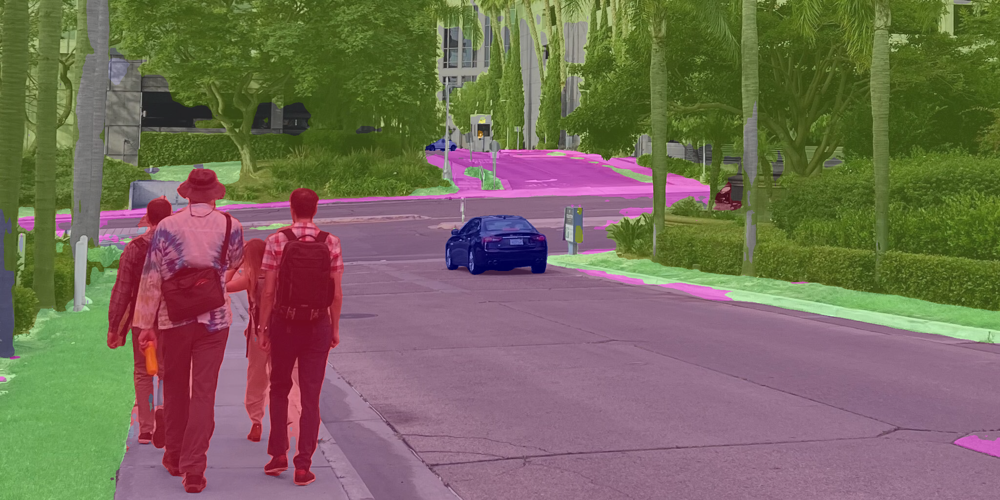

In [31]:
# Runs the model from real device (e.g.,via ADB for Androids devices)
# Goal: Achieve the same results (performance) on a particular the device
# %run -m qai_hub_models.models.ffnet_40s.demo -- --device "$selected_device" --on-device
%run -m qai_hub_models.models.ffnet_40s.demo -- --device "Xiaomi 12 Pro" --on-device

## Output Analysis & Interpretations


| Target | Inference time (ms) | Peak Memory Usage (MB)| Interpretation |
|---|---|---|---|
| Cloud Server | 0.005*  | 1777* | The cloud server provides the baseline performance. |
| Hosted Device | 60.0 | 7 - 22 | The hosted device has higher inference time and Peak Memory Usage compared to the cloud server. |
| Physical Device | 58.6 | 5 - 23 | The physical device has similar inference time and Peak Memory Usage to the hosted device. It shows the good correlation between the sim and the real device.|


<p style="background-color:#fff6e4; padding:15px; border-width:3px; border-color:#f5ecda; border-style:solid; border-radius:6px"> ⏳ <b>Note:</b> These results may vary based on current environment setup.</p>

## References

- [Qualcomm AI Hub](https://aihub.qualcomm.com/)
  - Models: [Qualcomm® AI Hub Models](https://github.com/quic/ai-hub-models/?tab=readme-ov-file)
  - Apps: [Qualcomm® AI Hub Apps](https://github.com/quic/ai-hub-apps)

- [Qualcomm AI Hub Documentation](https://app.aihub.qualcomm.com/docs/)
- [FFNet Paper](https://arxiv.org/abs/2206.08236)